In [1]:
import pandas as pd, numpy as np
import numpy as np
from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler,Normalizer
import matplotlib.pyplot as plt

In [2]:
file_paths="/kaggle/input/data-kirk-oswald/data_ann (2).csv"

In [3]:
df=pd.read_csv(file_paths)
df.columns = df.columns.str.replace(' ', '')
df.set_index("Date",inplace=True)
#df = df.loc[:,df.columns != "Date"]
df.interpolate(method ='linear', limit_direction ='both',inplace=True)

In [4]:
# develop the linear regression model and outputs
def linear_reg_model(feature_of_Interest):
    '''
    Input: the feature that we are interested in

    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)

    '''
    #feature_of_Interest='GECU3M_lag_1'
    from sklearn.preprocessing import StandardScaler,Normalizer

    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)

    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)

    #lasso_model = Lasso(alpha=4)
    #lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    #selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train#[list(selected_columns)]
    X_test=X_test#[list(selected_columns)]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)

    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    from sklearn.linear_model import LinearRegression

    # Assuming X_train and y_train represent your original features and target
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_train_normalized, y_train)

    # Use the trained model to predict new values based on X_train
    synthetic_data = model.predict(X_train_normalized)

    # Now y_train_combined contains the original target data along with synthetic data

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    mse_values=(predictions - y_test_forecast)**2
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

In [5]:
#nn relfeat_non_normalized
def NN_RelFeat_non_normalized(feature_of_Interest):

    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized.iloc[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=800, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

In [6]:
#nn relfeat
def NN_RelFeat(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    
    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]
    
    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

In [7]:
#nn TgtOnly
def NN_TgtOnly(feature_of_Interest):

    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''

    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]


    X_train, X_test, y_train, y_test = train_test_split(y[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are your feature sets
    scaler = StandardScaler()
    

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    #y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    #std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    #mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    #std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a


In [8]:
#NN RelFeat+LRdata
def RealFeat_LRdata(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]

    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)

    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train1 = scaler.fit_transform(X_train)
    X_test1 = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized1 = X_train1
    X_test_normalized1 = X_test1

    ###################################################################################
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)

    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)
    # Use the trained model to predict new values based on X_train
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2
    #####################################################################################

    # Normalize train and test sets
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))

    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }

    return a
    

In [9]:
#nn TgtOnly + LRdata
def NN_TgtOnly_LRdata(feature_of_Interest):
    
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]

    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are feature sets

    #selected_features = pd.DataFrame(index=X_train.columns)
    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train1 = scaler.fit_transform(X_train)
    X_test1 = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized1 = X_train1
    X_test_normalized1 = X_test1

    ###################################################################################
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)

    # Use the trained model to predict new values based on X_train
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)

    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2

    X_train[feature_of_Interest]=y_train
    X_test[feature_of_Interest]=y_test

    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

In [10]:
horizons=[1,6,11,16,21]
yields=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse=[]
fig_5={}
table4_data=[]
for i in horizons:
    by_maturity=[]
    for j in yields:
        #print(j+str(i))
        target_=j+str(i)
        a=linear_reg_model(target_)
        b=NN_RelFeat(target_)
        c=NN_TgtOnly(target_)
        d=RealFeat_LRdata(target_)
        e=NN_TgtOnly_LRdata(target_)
        if (i==1 and target_=='GECU10YR_lag_1'):#list_mse1[0][3][1]
            fig_5.update({'Actual_Yield':b['Actual_Yield'],'Predicted_Yield':b['Predicted_Yield'],'GECU10YR_lag_1':b})
            #fig_5.append([b['Actual_Yield'],b['Predicted_Yield']])
        by_maturity.append([a['mse_values'],b['mse_values'],c['mse_values'],d['mse_values'],e['mse_values']])
    list_mse.append(by_maturity)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.213e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.3881 - mae: 1.4970 - mse: 3.3881 - root_mean_squared_error: 1.8407 - val_loss: 0.6267 - val_mae: 0.6061 - val_mse: 0.6267 - val_root_mean_squared_error: 0.7916
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5124 - mae: 0.5252 - mse: 0.5124 - root_mean_squared_error: 0.7158 - val_loss: 0.2373 - val_mae: 0.3694 - val_mse: 0.2373 - val_root_mean_squared_error: 0.4872
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1583 - mae: 0.3042 - mse: 0.1583 - root_mean_squared_error: 0.3978 - val_loss: 0.0799 - val_mae: 0.2242 - val_mse: 0.0799 - val_root_mean_squared_error: 0.2826
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0748 - mae: 0.2216 - mse: 0.0748 - root_mean_squared_error: 0.2734 - val_loss: 0.0463 - val_mae: 0.1646 - val_mse: 0.0463 - val_root_mean_squared_error: 0.2151
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.151e+00, tolerance: 4.039e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.9173 - mae: 1.5356 - mse: 3.9173 - root_mean_squared_error: 1.9792 - val_loss: 0.4435 - val_mae: 0.5190 - val_mse: 0.4435 - val_root_mean_squared_error: 0.6660
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3186 - mae: 0.4365 - mse: 0.3186 - root_mean_squared_error: 0.5645 - val_loss: 0.1380 - val_mae: 0.2946 - val_mse: 0.1380 - val_root_mean_squared_error: 0.3715
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1053 - mae: 0.2560 - mse: 0.1053 - root_mean_squared_error: 0.3245 - val_loss: 0.0726 - val_mae: 0.2079 - val_mse: 0.0726 - val_root_mean_squared_error: 0.2694
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0636 - mae: 0.1948 - mse: 0.0636 - root_mean_squared_error: 0.2522 - val_loss: 0.0569 - val_mae: 0.1797 - val_mse: 0.0569 - val_root_mean_squared_error: 0.2384
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.975e+00, tolerance: 3.962e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.5808 - mae: 1.7167 - mse: 4.5808 - root_mean_squared_error: 2.1403 - val_loss: 0.8971 - val_mae: 0.7067 - val_mse: 0.8971 - val_root_mean_squared_error: 0.9471
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6903 - mae: 0.6328 - mse: 0.6903 - root_mean_squared_error: 0.8308 - val_loss: 0.3475 - val_mae: 0.4118 - val_mse: 0.3475 - val_root_mean_squared_error: 0.5895
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2549 - mae: 0.3698 - mse: 0.2549 - root_mean_squared_error: 0.5048 - val_loss: 0.0911 - val_mae: 0.2220 - val_mse: 0.0911 - val_root_mean_squared_error: 0.3019
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1120 - mae: 0.2572 - mse: 0.1120 - root_mean_squared_error: 0.3346 - val_loss: 0.0573 - val_mae: 0.1734 - val_mse: 0.0573 - val_root_mean_squared_error: 0.2394
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.474e+00, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.3173 - mae: 1.5334 - mse: 3.3173 - root_mean_squared_error: 1.8214 - val_loss: 0.5205 - val_mae: 0.6157 - val_mse: 0.5205 - val_root_mean_squared_error: 0.7215
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4441 - mae: 0.5332 - mse: 0.4441 - root_mean_squared_error: 0.6664 - val_loss: 0.2708 - val_mae: 0.4231 - val_mse: 0.2708 - val_root_mean_squared_error: 0.5204
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2249 - mae: 0.3676 - mse: 0.2249 - root_mean_squared_error: 0.4743 - val_loss: 0.1662 - val_mae: 0.3454 - val_mse: 0.1662 - val_root_mean_squared_error: 0.4077
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1418 - mae: 0.2852 - mse: 0.1418 - root_mean_squared_error: 0.3765 - val_loss: 0.1143 - val_mae: 0.2971 - val_mse: 0.1143 - val_root_mean_squared_error: 0.3380
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.519e+00, tolerance: 3.327e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.8098 - mae: 1.6716 - mse: 3.8098 - root_mean_squared_error: 1.9519 - val_loss: 1.7340 - val_mae: 1.1325 - val_mse: 1.7340 - val_root_mean_squared_error: 1.3168
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5380 - mae: 0.5784 - mse: 0.5380 - root_mean_squared_error: 0.7335 - val_loss: 0.2350 - val_mae: 0.3426 - val_mse: 0.2350 - val_root_mean_squared_error: 0.4847
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1106 - mae: 0.2453 - mse: 0.1106 - root_mean_squared_error: 0.3326 - val_loss: 0.1388 - val_mae: 0.2570 - val_mse: 0.1388 - val_root_mean_squared_error: 0.3726
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0720 - mae: 0.1998 - mse: 0.0720 - root_mean_squared_error: 0.2683 - val_loss: 0.1096 - val_mae: 0.2232 - val_mse: 0.1096 - val_root_mean_squared_error: 0.3310
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.475e+00, tolerance: 3.282e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.9247 - mae: 1.6817 - mse: 3.9247 - root_mean_squared_error: 1.9811 - val_loss: 2.2373 - val_mae: 1.2553 - val_mse: 2.2373 - val_root_mean_squared_error: 1.4957
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.7650 - mae: 0.6830 - mse: 0.7650 - root_mean_squared_error: 0.8746 - val_loss: 0.6233 - val_mae: 0.5791 - val_mse: 0.6233 - val_root_mean_squared_error: 0.7895
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2320 - mae: 0.3623 - mse: 0.2320 - root_mean_squared_error: 0.4817 - val_loss: 0.3598 - val_mae: 0.4341 - val_mse: 0.3598 - val_root_mean_squared_error: 0.5998
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1413 - mae: 0.2820 - mse: 0.1413 - root_mean_squared_error: 0.3758 - val_loss: 0.2321 - val_mae: 0.3420 - val_mse: 0.2321 - val_root_mean_squared_error: 0.4817
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.137e+00, tolerance: 2.071e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.2159 - mae: 1.7826 - mse: 4.2159 - root_mean_squared_error: 2.0533 - val_loss: 0.6318 - val_mae: 0.6711 - val_mse: 0.6318 - val_root_mean_squared_error: 0.7949
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2874 - mae: 0.4027 - mse: 0.2874 - root_mean_squared_error: 0.5361 - val_loss: 0.1463 - val_mae: 0.3120 - val_mse: 0.1463 - val_root_mean_squared_error: 0.3826
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1020 - mae: 0.2473 - mse: 0.1020 - root_mean_squared_error: 0.3193 - val_loss: 0.0996 - val_mae: 0.2569 - val_mse: 0.0996 - val_root_mean_squared_error: 0.3156
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0791 - mae: 0.2179 - mse: 0.0791 - root_mean_squared_error: 0.2813 - val_loss: 0.0842 - val_mae: 0.2283 - val_mse: 0.0842 - val_root_mean_squared_error: 0.2901
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.143e+00, tolerance: 2.110e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.7685 - mae: 1.9862 - mse: 4.7685 - root_mean_squared_error: 2.1837 - val_loss: 1.0084 - val_mae: 0.8696 - val_mse: 1.0084 - val_root_mean_squared_error: 1.0042
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5191 - mae: 0.5685 - mse: 0.5191 - root_mean_squared_error: 0.7205 - val_loss: 0.2252 - val_mae: 0.3613 - val_mse: 0.2252 - val_root_mean_squared_error: 0.4746
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2118 - mae: 0.3482 - mse: 0.2118 - root_mean_squared_error: 0.4602 - val_loss: 0.1357 - val_mae: 0.3085 - val_mse: 0.1357 - val_root_mean_squared_error: 0.3684
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1287 - mae: 0.2771 - mse: 0.1287 - root_mean_squared_error: 0.3587 - val_loss: 0.1074 - val_mae: 0.2763 - val_mse: 0.1074 - val_root_mean_squared_error: 0.3278
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.172e+00, tolerance: 2.111e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.1420 - mae: 1.7786 - mse: 4.1420 - root_mean_squared_error: 2.0352 - val_loss: 0.7015 - val_mae: 0.6891 - val_mse: 0.7015 - val_root_mean_squared_error: 0.8376
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3964 - mae: 0.4780 - mse: 0.3964 - root_mean_squared_error: 0.6296 - val_loss: 0.1800 - val_mae: 0.3378 - val_mse: 0.1800 - val_root_mean_squared_error: 0.4242
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1697 - mae: 0.3167 - mse: 0.1697 - root_mean_squared_error: 0.4119 - val_loss: 0.1281 - val_mae: 0.2807 - val_mse: 0.1281 - val_root_mean_squared_error: 0.3579
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1102 - mae: 0.2534 - mse: 0.1102 - root_mean_squared_error: 0.3320 - val_loss: 0.0977 - val_mae: 0.2480 - val_mse: 0.0977 - val_root_mean_squared_error: 0.3126
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.4651 - mae: 2.5269 - mse: 7.4651 - root_mean_squared_error: 2.7322 - val_loss: 1.8982 - val_mae: 1.1475 - val_mse: 1.8982 - val_root_mean_squared_error: 1.3778
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8616 - mae: 0.6972 - mse: 0.8616 - root_mean_squared_error: 0.9282 - val_loss: 0.4981 - val_mae: 0.5326 - val_mse: 0.4981 - val_root_mean_squared_error: 0.7058
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2129 - mae: 0.3584 - mse: 0.2129 - root_mean_squared_error: 0.4614 - val_loss: 0.2280 - val_mae: 0.3635 - val_mse: 0.2280 - val_root_mean_squared_error: 0.4775
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1080 - mae: 0.2535 - mse: 0.1080 - root_mean_squared_error: 0.3287 - val_loss: 0.1695 - val_mae: 0.3264 - val_mse: 0.1695 - val_root_mean_squared_error: 0.4117
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.576e+00, tolerance: 1.320e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.4675 - mae: 2.8178 - mse: 9.4675 - root_mean_squared_error: 3.0769 - val_loss: 5.1097 - val_mae: 1.8671 - val_mse: 5.1097 - val_root_mean_squared_error: 2.2605
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.6534 - mae: 1.5966 - mse: 3.6534 - root_mean_squared_error: 1.9114 - val_loss: 1.1711 - val_mae: 0.9279 - val_mse: 1.1711 - val_root_mean_squared_error: 1.0822
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5748 - mae: 0.5968 - mse: 0.5748 - root_mean_squared_error: 0.7582 - val_loss: 0.1753 - val_mae: 0.3140 - val_mse: 0.1753 - val_root_mean_squared_error: 0.4187
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1542 - mae: 0.3192 - mse: 0.1542 - root_mean_squared_error: 0.3927 - val_loss: 0.1160 - val_mae: 0.2751 - val_mse: 0.1160 - val_root_mean_squared_error: 0.3406
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.504e+00, tolerance: 1.285e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 2s 24ms/step - loss: 8.7514 - mae: 2.7209 - mse: 8.7514 - root_mean_squared_error: 2.9583 - val_loss: 4.1038 - val_mae: 1.7771 - val_mse: 4.1038 - val_root_mean_squared_error: 2.0258
Epoch 2/500
33/33 [==============================] - 0s 5ms/step - loss: 1.5950 - mae: 1.0034 - mse: 1.5950 - root_mean_squared_error: 1.2629 - val_loss: 0.2192 - val_mae: 0.3671 - val_mse: 0.2192 - val_root_mean_squared_error: 0.4682
Epoch 3/500
33/33 [==============================] - 0s 5ms/step - loss: 0.1776 - mae: 0.3233 - mse: 0.1776 - root_mean_squared_error: 0.4214 - val_loss: 0.1088 - val_mae: 0.2611 - val_mse: 0.1088 - val_root_mean_squared_error: 0.3298
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1176 - mae: 0.2684 - mse: 0.1176 - root_mean_squared_error: 0.3430 - val_loss: 0.0740 - val_mae: 0.2063 - val_mse: 0.0740 - val_root_mean_squared_error: 0.2720
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.246e+00, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.6616 - mae: 3.0959 - mse: 10.6616 - root_mean_squared_error: 3.2652 - val_loss: 3.9297 - val_mae: 1.7757 - val_mse: 3.9297 - val_root_mean_squared_error: 1.9824
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.6090 - mae: 1.0076 - mse: 1.6090 - root_mean_squared_error: 1.2684 - val_loss: 0.7142 - val_mae: 0.6499 - val_mse: 0.7142 - val_root_mean_squared_error: 0.8451
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4846 - mae: 0.5169 - mse: 0.4846 - root_mean_squared_error: 0.6961 - val_loss: 0.3606 - val_mae: 0.4377 - val_mse: 0.3606 - val_root_mean_squared_error: 0.6005
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2986 - mae: 0.4038 - mse: 0.2986 - root_mean_squared_error: 0.5465 - val_loss: 0.2746 - val_mae: 0.3880 - val_mse: 0.2746 - val_root_mean_squared_error: 0.5240
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.260e+00, tolerance: 1.164e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 10.2913 - mae: 2.9977 - mse: 10.2913 - root_mean_squared_error: 3.2080 - val_loss: 3.1511 - val_mae: 1.5617 - val_mse: 3.1511 - val_root_mean_squared_error: 1.7751
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1515 - mae: 0.8430 - mse: 1.1515 - root_mean_squared_error: 1.0731 - val_loss: 0.4172 - val_mae: 0.4929 - val_mse: 0.4172 - val_root_mean_squared_error: 0.6459
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3660 - mae: 0.4727 - mse: 0.3660 - root_mean_squared_error: 0.6050 - val_loss: 0.2535 - val_mae: 0.4088 - val_mse: 0.2535 - val_root_mean_squared_error: 0.5035
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2336 - mae: 0.3838 - mse: 0.2336 - root_mean_squared_error: 0.4834 - val_loss: 0.1820 - val_mae: 0.3515 - val_mse: 0.1820 - val_root_mean_squared_error: 0.4266
Epoch 5/500
33/33 [==============================] - 0s 3

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.246e+00, tolerance: 1.158e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 12.2402 - mae: 3.2077 - mse: 12.2402 - root_mean_squared_error: 3.4986 - val_loss: 5.9672 - val_mae: 2.1551 - val_mse: 5.9672 - val_root_mean_squared_error: 2.4428
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.1510 - mae: 1.3832 - mse: 3.1510 - root_mean_squared_error: 1.7751 - val_loss: 1.7343 - val_mae: 1.0299 - val_mse: 1.7343 - val_root_mean_squared_error: 1.3169
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9303 - mae: 0.7149 - mse: 0.9303 - root_mean_squared_error: 0.9645 - val_loss: 0.6177 - val_mae: 0.5878 - val_mse: 0.6177 - val_root_mean_squared_error: 0.7860
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.3708 - mae: 0.4562 - mse: 0.3708 - root_mean_squared_error: 0.6089 - val_loss: 0.2791 - val_mae: 0.3941 - val_mse: 0.2791 - val_root_mean_squared_error: 0.5283
Epoch 5/500
33/33 [==============================] - 0s 4m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.166e+00, tolerance: 3.962e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.3999 - mae: 1.8088 - mse: 5.3999 - root_mean_squared_error: 2.3238 - val_loss: 1.1437 - val_mae: 0.8808 - val_mse: 1.1437 - val_root_mean_squared_error: 1.0694
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0256 - mae: 0.6720 - mse: 1.0256 - root_mean_squared_error: 1.0127 - val_loss: 0.3194 - val_mae: 0.3811 - val_mse: 0.3194 - val_root_mean_squared_error: 0.5652
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3310 - mae: 0.3880 - mse: 0.3310 - root_mean_squared_error: 0.5754 - val_loss: 0.1138 - val_mae: 0.2234 - val_mse: 0.1138 - val_root_mean_squared_error: 0.3373
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1107 - mae: 0.2417 - mse: 0.1107 - root_mean_squared_error: 0.3327 - val_loss: 0.0618 - val_mae: 0.1821 - val_mse: 0.0618 - val_root_mean_squared_error: 0.2486
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.406e+00, tolerance: 3.969e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.1396 - mae: 2.0336 - mse: 6.1396 - root_mean_squared_error: 2.4778 - val_loss: 2.2996 - val_mae: 1.3068 - val_mse: 2.2996 - val_root_mean_squared_error: 1.5165
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7545 - mae: 0.6547 - mse: 0.7545 - root_mean_squared_error: 0.8686 - val_loss: 0.4128 - val_mae: 0.4696 - val_mse: 0.4128 - val_root_mean_squared_error: 0.6425
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1864 - mae: 0.3184 - mse: 0.1864 - root_mean_squared_error: 0.4317 - val_loss: 0.1176 - val_mae: 0.2727 - val_mse: 0.1176 - val_root_mean_squared_error: 0.3430
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0701 - mae: 0.2081 - mse: 0.0701 - root_mean_squared_error: 0.2649 - val_loss: 0.0570 - val_mae: 0.1894 - val_mse: 0.0570 - val_root_mean_squared_error: 0.2388
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.178e+00, tolerance: 4.037e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.4685 - mae: 1.6855 - mse: 4.4685 - root_mean_squared_error: 2.1139 - val_loss: 0.5757 - val_mae: 0.6029 - val_mse: 0.5757 - val_root_mean_squared_error: 0.7587
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5367 - mae: 0.5342 - mse: 0.5367 - root_mean_squared_error: 0.7326 - val_loss: 0.1705 - val_mae: 0.3169 - val_mse: 0.1705 - val_root_mean_squared_error: 0.4129
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1670 - mae: 0.3072 - mse: 0.1670 - root_mean_squared_error: 0.4087 - val_loss: 0.0737 - val_mae: 0.2188 - val_mse: 0.0737 - val_root_mean_squared_error: 0.2714
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0791 - mae: 0.2159 - mse: 0.0791 - root_mean_squared_error: 0.2813 - val_loss: 0.0495 - val_mae: 0.1758 - val_mse: 0.0495 - val_root_mean_squared_error: 0.2225
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.600e+00, tolerance: 3.268e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.6038 - mae: 1.8131 - mse: 4.6038 - root_mean_squared_error: 2.1456 - val_loss: 0.9405 - val_mae: 0.8190 - val_mse: 0.9405 - val_root_mean_squared_error: 0.9698
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4063 - mae: 0.4939 - mse: 0.4063 - root_mean_squared_error: 0.6375 - val_loss: 0.1773 - val_mae: 0.3654 - val_mse: 0.1773 - val_root_mean_squared_error: 0.4210
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1456 - mae: 0.2933 - mse: 0.1456 - root_mean_squared_error: 0.3816 - val_loss: 0.1070 - val_mae: 0.2768 - val_mse: 0.1070 - val_root_mean_squared_error: 0.3271
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0880 - mae: 0.2336 - mse: 0.0880 - root_mean_squared_error: 0.2966 - val_loss: 0.0640 - val_mae: 0.2106 - val_mse: 0.0640 - val_root_mean_squared_error: 0.2530
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.615e+00, tolerance: 3.260e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.4484 - mae: 1.6147 - mse: 3.4484 - root_mean_squared_error: 1.8570 - val_loss: 1.1380 - val_mae: 0.9502 - val_mse: 1.1380 - val_root_mean_squared_error: 1.0668
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.4932 - mae: 0.5606 - mse: 0.4932 - root_mean_squared_error: 0.7023 - val_loss: 0.1900 - val_mae: 0.3501 - val_mse: 0.1900 - val_root_mean_squared_error: 0.4359
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1400 - mae: 0.2825 - mse: 0.1400 - root_mean_squared_error: 0.3742 - val_loss: 0.1248 - val_mae: 0.3115 - val_mse: 0.1248 - val_root_mean_squared_error: 0.3533
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1030 - mae: 0.2370 - mse: 0.1030 - root_mean_squared_error: 0.3209 - val_loss: 0.0997 - val_mae: 0.2750 - val_mse: 0.0997 - val_root_mean_squared_error: 0.3157
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.611e+00, tolerance: 3.281e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.9052 - mae: 1.6655 - mse: 3.9052 - root_mean_squared_error: 1.9762 - val_loss: 1.3366 - val_mae: 0.9673 - val_mse: 1.3366 - val_root_mean_squared_error: 1.1561
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7648 - mae: 0.6971 - mse: 0.7648 - root_mean_squared_error: 0.8745 - val_loss: 0.4969 - val_mae: 0.5158 - val_mse: 0.4969 - val_root_mean_squared_error: 0.7049
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2568 - mae: 0.3701 - mse: 0.2568 - root_mean_squared_error: 0.5067 - val_loss: 0.1527 - val_mae: 0.3002 - val_mse: 0.1527 - val_root_mean_squared_error: 0.3908
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1092 - mae: 0.2402 - mse: 0.1092 - root_mean_squared_error: 0.3305 - val_loss: 0.0882 - val_mae: 0.2076 - val_mse: 0.0882 - val_root_mean_squared_error: 0.2969
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.173e+00, tolerance: 2.059e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.6861 - mae: 1.8805 - mse: 4.6861 - root_mean_squared_error: 2.1647 - val_loss: 1.3121 - val_mae: 0.9751 - val_mse: 1.3121 - val_root_mean_squared_error: 1.1454
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4865 - mae: 0.5497 - mse: 0.4865 - root_mean_squared_error: 0.6975 - val_loss: 0.1526 - val_mae: 0.3117 - val_mse: 0.1526 - val_root_mean_squared_error: 0.3907
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1363 - mae: 0.2959 - mse: 0.1363 - root_mean_squared_error: 0.3692 - val_loss: 0.0809 - val_mae: 0.2275 - val_mse: 0.0809 - val_root_mean_squared_error: 0.2844
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0809 - mae: 0.2256 - mse: 0.0809 - root_mean_squared_error: 0.2844 - val_loss: 0.0673 - val_mae: 0.2009 - val_mse: 0.0673 - val_root_mean_squared_error: 0.2594
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.172e+00, tolerance: 2.110e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.5425 - mae: 1.8738 - mse: 4.5425 - root_mean_squared_error: 2.1313 - val_loss: 0.9900 - val_mae: 0.8122 - val_mse: 0.9900 - val_root_mean_squared_error: 0.9950
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4779 - mae: 0.5511 - mse: 0.4779 - root_mean_squared_error: 0.6913 - val_loss: 0.2068 - val_mae: 0.3621 - val_mse: 0.2068 - val_root_mean_squared_error: 0.4547
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1450 - mae: 0.2998 - mse: 0.1450 - root_mean_squared_error: 0.3808 - val_loss: 0.1061 - val_mae: 0.2558 - val_mse: 0.1061 - val_root_mean_squared_error: 0.3258
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0847 - mae: 0.2296 - mse: 0.0847 - root_mean_squared_error: 0.2911 - val_loss: 0.0787 - val_mae: 0.2211 - val_mse: 0.0787 - val_root_mean_squared_error: 0.2806
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.179e+00, tolerance: 2.115e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.3028 - mae: 1.8280 - mse: 4.3028 - root_mean_squared_error: 2.0743 - val_loss: 1.0835 - val_mae: 0.8006 - val_mse: 1.0835 - val_root_mean_squared_error: 1.0409
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5375 - mae: 0.5569 - mse: 0.5375 - root_mean_squared_error: 0.7331 - val_loss: 0.2868 - val_mae: 0.3954 - val_mse: 0.2868 - val_root_mean_squared_error: 0.5356
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2344 - mae: 0.3648 - mse: 0.2344 - root_mean_squared_error: 0.4841 - val_loss: 0.1991 - val_mae: 0.3284 - val_mse: 0.1991 - val_root_mean_squared_error: 0.4463
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1638 - mae: 0.3020 - mse: 0.1638 - root_mean_squared_error: 0.4047 - val_loss: 0.1598 - val_mae: 0.3033 - val_mse: 0.1598 - val_root_mean_squared_error: 0.3998
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.409e+00, tolerance: 1.277e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.1426 - mae: 2.6273 - mse: 8.1426 - root_mean_squared_error: 2.8535 - val_loss: 2.8522 - val_mae: 1.4603 - val_mse: 2.8522 - val_root_mean_squared_error: 1.6888
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7907 - mae: 0.6969 - mse: 0.7907 - root_mean_squared_error: 0.8892 - val_loss: 0.3565 - val_mae: 0.4671 - val_mse: 0.3565 - val_root_mean_squared_error: 0.5971
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2303 - mae: 0.3630 - mse: 0.2303 - root_mean_squared_error: 0.4799 - val_loss: 0.2074 - val_mae: 0.3624 - val_mse: 0.2074 - val_root_mean_squared_error: 0.4554
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1601 - mae: 0.3041 - mse: 0.1601 - root_mean_squared_error: 0.4001 - val_loss: 0.1488 - val_mae: 0.3086 - val_mse: 0.1488 - val_root_mean_squared_error: 0.3857
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.446e+00, tolerance: 1.305e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.2075 - mae: 2.7987 - mse: 9.2075 - root_mean_squared_error: 3.0344 - val_loss: 2.5921 - val_mae: 1.4256 - val_mse: 2.5921 - val_root_mean_squared_error: 1.6100
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4678 - mae: 0.9589 - mse: 1.4678 - root_mean_squared_error: 1.2115 - val_loss: 0.4433 - val_mae: 0.5445 - val_mse: 0.4433 - val_root_mean_squared_error: 0.6658
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4352 - mae: 0.5111 - mse: 0.4352 - root_mean_squared_error: 0.6597 - val_loss: 0.1443 - val_mae: 0.3143 - val_mse: 0.1443 - val_root_mean_squared_error: 0.3798
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1605 - mae: 0.3150 - mse: 0.1605 - root_mean_squared_error: 0.4007 - val_loss: 0.0598 - val_mae: 0.1949 - val_mse: 0.0598 - val_root_mean_squared_error: 0.2445
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.429e+00, tolerance: 1.303e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.9005 - mae: 2.7180 - mse: 8.9005 - root_mean_squared_error: 2.9834 - val_loss: 3.1565 - val_mae: 1.4725 - val_mse: 3.1565 - val_root_mean_squared_error: 1.7766
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.8446 - mae: 1.0116 - mse: 1.8446 - root_mean_squared_error: 1.3582 - val_loss: 0.7022 - val_mae: 0.6721 - val_mse: 0.7022 - val_root_mean_squared_error: 0.8380
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3642 - mae: 0.4593 - mse: 0.3642 - root_mean_squared_error: 0.6035 - val_loss: 0.1306 - val_mae: 0.2998 - val_mse: 0.1306 - val_root_mean_squared_error: 0.3613
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1403 - mae: 0.2740 - mse: 0.1403 - root_mean_squared_error: 0.3746 - val_loss: 0.0923 - val_mae: 0.2454 - val_mse: 0.0923 - val_root_mean_squared_error: 0.3038
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.130e+00, tolerance: 1.122e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.0369 - mae: 2.7827 - mse: 9.0369 - root_mean_squared_error: 3.0061 - val_loss: 2.2063 - val_mae: 1.2839 - val_mse: 2.2063 - val_root_mean_squared_error: 1.4853
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0355 - mae: 0.8216 - mse: 1.0355 - root_mean_squared_error: 1.0176 - val_loss: 0.5540 - val_mae: 0.6192 - val_mse: 0.5540 - val_root_mean_squared_error: 0.7443
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2991 - mae: 0.4420 - mse: 0.2991 - root_mean_squared_error: 0.5469 - val_loss: 0.2575 - val_mae: 0.4156 - val_mse: 0.2575 - val_root_mean_squared_error: 0.5074
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1916 - mae: 0.3450 - mse: 0.1916 - root_mean_squared_error: 0.4377 - val_loss: 0.2120 - val_mae: 0.3730 - val_mse: 0.2120 - val_root_mean_squared_error: 0.4605
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.145e+00, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.5000 - mae: 2.9597 - mse: 10.5000 - root_mean_squared_error: 3.2404 - val_loss: 3.0704 - val_mae: 1.5212 - val_mse: 3.0704 - val_root_mean_squared_error: 1.7523
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4495 - mae: 0.9424 - mse: 1.4495 - root_mean_squared_error: 1.2040 - val_loss: 0.2678 - val_mae: 0.4349 - val_mse: 0.2678 - val_root_mean_squared_error: 0.5175
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3244 - mae: 0.4364 - mse: 0.3244 - root_mean_squared_error: 0.5696 - val_loss: 0.1135 - val_mae: 0.2680 - val_mse: 0.1135 - val_root_mean_squared_error: 0.3369
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1539 - mae: 0.3054 - mse: 0.1539 - root_mean_squared_error: 0.3924 - val_loss: 0.1040 - val_mae: 0.2525 - val_mse: 0.1040 - val_root_mean_squared_error: 0.3225
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.124e+00, tolerance: 1.133e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 11.4794 - mae: 3.1306 - mse: 11.4794 - root_mean_squared_error: 3.3881 - val_loss: 4.2846 - val_mae: 1.7179 - val_mse: 4.2846 - val_root_mean_squared_error: 2.0699
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.5073 - mae: 1.1946 - mse: 2.5073 - root_mean_squared_error: 1.5834 - val_loss: 1.0930 - val_mae: 0.7650 - val_mse: 1.0930 - val_root_mean_squared_error: 1.0455
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6775 - mae: 0.6434 - mse: 0.6775 - root_mean_squared_error: 0.8231 - val_loss: 0.3263 - val_mae: 0.4460 - val_mse: 0.3263 - val_root_mean_squared_error: 0.5712
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2343 - mae: 0.3903 - mse: 0.2343 - root_mean_squared_error: 0.4840 - val_loss: 0.1452 - val_mae: 0.2926 - val_mse: 0.1452 - val_root_mean_squared_error: 0.3811
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.455e+00, tolerance: 3.955e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.4476 - mae: 1.7042 - mse: 4.4476 - root_mean_squared_error: 2.1089 - val_loss: 0.9168 - val_mae: 0.7120 - val_mse: 0.9168 - val_root_mean_squared_error: 0.9575
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5667 - mae: 0.5794 - mse: 0.5667 - root_mean_squared_error: 0.7528 - val_loss: 0.3613 - val_mae: 0.4412 - val_mse: 0.3613 - val_root_mean_squared_error: 0.6011
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2061 - mae: 0.3391 - mse: 0.2061 - root_mean_squared_error: 0.4540 - val_loss: 0.1338 - val_mae: 0.2870 - val_mse: 0.1338 - val_root_mean_squared_error: 0.3658
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1019 - mae: 0.2508 - mse: 0.1019 - root_mean_squared_error: 0.3193 - val_loss: 0.0862 - val_mae: 0.2382 - val_mse: 0.0862 - val_root_mean_squared_error: 0.2936
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.527e+00, tolerance: 3.987e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.1112 - mae: 1.6462 - mse: 4.1112 - root_mean_squared_error: 2.0276 - val_loss: 0.7981 - val_mae: 0.7502 - val_mse: 0.7981 - val_root_mean_squared_error: 0.8934
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4024 - mae: 0.4994 - mse: 0.4024 - root_mean_squared_error: 0.6344 - val_loss: 0.2056 - val_mae: 0.3563 - val_mse: 0.2056 - val_root_mean_squared_error: 0.4534
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1275 - mae: 0.2759 - mse: 0.1275 - root_mean_squared_error: 0.3571 - val_loss: 0.0693 - val_mae: 0.2137 - val_mse: 0.0693 - val_root_mean_squared_error: 0.2632
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0723 - mae: 0.2025 - mse: 0.0723 - root_mean_squared_error: 0.2689 - val_loss: 0.0475 - val_mae: 0.1842 - val_mse: 0.0475 - val_root_mean_squared_error: 0.2179
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.555e+00, tolerance: 4.014e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.6667 - mae: 1.7669 - mse: 4.6667 - root_mean_squared_error: 2.1603 - val_loss: 0.8507 - val_mae: 0.6871 - val_mse: 0.8507 - val_root_mean_squared_error: 0.9223
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6350 - mae: 0.6146 - mse: 0.6350 - root_mean_squared_error: 0.7969 - val_loss: 0.4276 - val_mae: 0.4750 - val_mse: 0.4276 - val_root_mean_squared_error: 0.6539
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2535 - mae: 0.3708 - mse: 0.2535 - root_mean_squared_error: 0.5035 - val_loss: 0.2481 - val_mae: 0.3674 - val_mse: 0.2481 - val_root_mean_squared_error: 0.4981
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1297 - mae: 0.2710 - mse: 0.1297 - root_mean_squared_error: 0.3602 - val_loss: 0.1320 - val_mae: 0.2914 - val_mse: 0.1320 - val_root_mean_squared_error: 0.3634
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.539e+00, tolerance: 3.260e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.6860 - mae: 1.7841 - mse: 4.6860 - root_mean_squared_error: 2.1647 - val_loss: 1.0117 - val_mae: 0.8086 - val_mse: 1.0117 - val_root_mean_squared_error: 1.0058
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6514 - mae: 0.6485 - mse: 0.6514 - root_mean_squared_error: 0.8071 - val_loss: 0.3644 - val_mae: 0.4689 - val_mse: 0.3644 - val_root_mean_squared_error: 0.6037
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2577 - mae: 0.4045 - mse: 0.2577 - root_mean_squared_error: 0.5077 - val_loss: 0.1556 - val_mae: 0.2996 - val_mse: 0.1556 - val_root_mean_squared_error: 0.3945
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1223 - mae: 0.2707 - mse: 0.1223 - root_mean_squared_error: 0.3498 - val_loss: 0.1123 - val_mae: 0.2500 - val_mse: 0.1123 - val_root_mean_squared_error: 0.3351
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.523e+00, tolerance: 3.255e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.5753 - mae: 1.5819 - mse: 3.5753 - root_mean_squared_error: 1.8908 - val_loss: 1.0998 - val_mae: 0.8297 - val_mse: 1.0998 - val_root_mean_squared_error: 1.0487
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7106 - mae: 0.6337 - mse: 0.7106 - root_mean_squared_error: 0.8430 - val_loss: 0.4499 - val_mae: 0.4805 - val_mse: 0.4499 - val_root_mean_squared_error: 0.6707
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3595 - mae: 0.4185 - mse: 0.3595 - root_mean_squared_error: 0.5996 - val_loss: 0.2201 - val_mae: 0.3110 - val_mse: 0.2201 - val_root_mean_squared_error: 0.4692
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1828 - mae: 0.2952 - mse: 0.1828 - root_mean_squared_error: 0.4276 - val_loss: 0.1366 - val_mae: 0.2523 - val_mse: 0.1366 - val_root_mean_squared_error: 0.3696
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.554e+00, tolerance: 3.307e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.0489 - mae: 1.4895 - mse: 3.0489 - root_mean_squared_error: 1.7461 - val_loss: 0.6563 - val_mae: 0.6558 - val_mse: 0.6563 - val_root_mean_squared_error: 0.8101
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4491 - mae: 0.5193 - mse: 0.4491 - root_mean_squared_error: 0.6701 - val_loss: 0.2228 - val_mae: 0.3754 - val_mse: 0.2228 - val_root_mean_squared_error: 0.4720
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1665 - mae: 0.3132 - mse: 0.1665 - root_mean_squared_error: 0.4080 - val_loss: 0.0925 - val_mae: 0.2344 - val_mse: 0.0925 - val_root_mean_squared_error: 0.3042
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0875 - mae: 0.2275 - mse: 0.0875 - root_mean_squared_error: 0.2958 - val_loss: 0.0720 - val_mae: 0.1996 - val_mse: 0.0720 - val_root_mean_squared_error: 0.2683
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.212e+00, tolerance: 2.041e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.9044 - mae: 1.9742 - mse: 4.9044 - root_mean_squared_error: 2.2146 - val_loss: 1.6703 - val_mae: 1.1170 - val_mse: 1.6703 - val_root_mean_squared_error: 1.2924
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.5903 - mae: 0.6035 - mse: 0.5903 - root_mean_squared_error: 0.7683 - val_loss: 0.1666 - val_mae: 0.3342 - val_mse: 0.1666 - val_root_mean_squared_error: 0.4081
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1426 - mae: 0.2906 - mse: 0.1426 - root_mean_squared_error: 0.3776 - val_loss: 0.0811 - val_mae: 0.2192 - val_mse: 0.0811 - val_root_mean_squared_error: 0.2847
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.0977 - mae: 0.2424 - mse: 0.0977 - root_mean_squared_error: 0.3125 - val_loss: 0.0704 - val_mae: 0.2067 - val_mse: 0.0704 - val_root_mean_squared_error: 0.2654
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.223e+00, tolerance: 2.066e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.9596 - mae: 1.9590 - mse: 4.9596 - root_mean_squared_error: 2.2270 - val_loss: 1.1355 - val_mae: 0.9439 - val_mse: 1.1355 - val_root_mean_squared_error: 1.0656
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5015 - mae: 0.5560 - mse: 0.5015 - root_mean_squared_error: 0.7082 - val_loss: 0.2694 - val_mae: 0.4148 - val_mse: 0.2694 - val_root_mean_squared_error: 0.5191
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1546 - mae: 0.3180 - mse: 0.1546 - root_mean_squared_error: 0.3932 - val_loss: 0.1251 - val_mae: 0.2758 - val_mse: 0.1251 - val_root_mean_squared_error: 0.3537
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0844 - mae: 0.2283 - mse: 0.0844 - root_mean_squared_error: 0.2906 - val_loss: 0.0811 - val_mae: 0.2063 - val_mse: 0.0811 - val_root_mean_squared_error: 0.2848
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.272e+00, tolerance: 2.065e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.6682 - mae: 2.1052 - mse: 5.6682 - root_mean_squared_error: 2.3808 - val_loss: 2.8715 - val_mae: 1.4263 - val_mse: 2.8715 - val_root_mean_squared_error: 1.6946
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2608 - mae: 0.8609 - mse: 1.2608 - root_mean_squared_error: 1.1228 - val_loss: 0.4830 - val_mae: 0.5524 - val_mse: 0.4830 - val_root_mean_squared_error: 0.6950
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2921 - mae: 0.3942 - mse: 0.2921 - root_mean_squared_error: 0.5405 - val_loss: 0.1623 - val_mae: 0.3128 - val_mse: 0.1623 - val_root_mean_squared_error: 0.4029
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1516 - mae: 0.2811 - mse: 0.1516 - root_mean_squared_error: 0.3894 - val_loss: 0.1131 - val_mae: 0.2534 - val_mse: 0.1131 - val_root_mean_squared_error: 0.3363
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.463e+00, tolerance: 1.265e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.1323 - mae: 2.6159 - mse: 8.1323 - root_mean_squared_error: 2.8517 - val_loss: 4.0212 - val_mae: 1.7133 - val_mse: 4.0212 - val_root_mean_squared_error: 2.0053
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.5125 - mae: 0.9562 - mse: 1.5125 - root_mean_squared_error: 1.2299 - val_loss: 0.3037 - val_mae: 0.4420 - val_mse: 0.3037 - val_root_mean_squared_error: 0.5511
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2092 - mae: 0.3603 - mse: 0.2092 - root_mean_squared_error: 0.4573 - val_loss: 0.1513 - val_mae: 0.3158 - val_mse: 0.1513 - val_root_mean_squared_error: 0.3889
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1323 - mae: 0.2836 - mse: 0.1323 - root_mean_squared_error: 0.3638 - val_loss: 0.1103 - val_mae: 0.2707 - val_mse: 0.1103 - val_root_mean_squared_error: 0.3322
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.429e+00, tolerance: 1.262e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.1355 - mae: 2.5281 - mse: 8.1355 - root_mean_squared_error: 2.8523 - val_loss: 2.9254 - val_mae: 1.4245 - val_mse: 2.9254 - val_root_mean_squared_error: 1.7104
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.6696 - mae: 1.0480 - mse: 1.6696 - root_mean_squared_error: 1.2921 - val_loss: 0.5580 - val_mae: 0.6105 - val_mse: 0.5580 - val_root_mean_squared_error: 0.7470
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3524 - mae: 0.4464 - mse: 0.3524 - root_mean_squared_error: 0.5936 - val_loss: 0.1531 - val_mae: 0.2980 - val_mse: 0.1531 - val_root_mean_squared_error: 0.3913
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1213 - mae: 0.2645 - mse: 0.1213 - root_mean_squared_error: 0.3483 - val_loss: 0.0983 - val_mae: 0.2423 - val_mse: 0.0983 - val_root_mean_squared_error: 0.3135
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.490e+00, tolerance: 1.324e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.8086 - mae: 2.7370 - mse: 8.8086 - root_mean_squared_error: 2.9679 - val_loss: 5.1336 - val_mae: 1.9228 - val_mse: 5.1336 - val_root_mean_squared_error: 2.2657
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7154 - mae: 0.9918 - mse: 1.7154 - root_mean_squared_error: 1.3097 - val_loss: 0.7209 - val_mae: 0.6541 - val_mse: 0.7209 - val_root_mean_squared_error: 0.8491
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3457 - mae: 0.4159 - mse: 0.3457 - root_mean_squared_error: 0.5880 - val_loss: 0.3429 - val_mae: 0.3991 - val_mse: 0.3429 - val_root_mean_squared_error: 0.5855
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1926 - mae: 0.3022 - mse: 0.1926 - root_mean_squared_error: 0.4388 - val_loss: 0.2515 - val_mae: 0.3563 - val_mse: 0.2515 - val_root_mean_squared_error: 0.5015
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.224e+00, tolerance: 1.111e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.2481 - mae: 2.7972 - mse: 9.2481 - root_mean_squared_error: 3.0411 - val_loss: 2.2937 - val_mae: 1.2671 - val_mse: 2.2937 - val_root_mean_squared_error: 1.5145
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3245 - mae: 0.8573 - mse: 1.3245 - root_mean_squared_error: 1.1508 - val_loss: 0.5754 - val_mae: 0.5523 - val_mse: 0.5754 - val_root_mean_squared_error: 0.7585
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3349 - mae: 0.4394 - mse: 0.3349 - root_mean_squared_error: 0.5787 - val_loss: 0.2240 - val_mae: 0.3414 - val_mse: 0.2240 - val_root_mean_squared_error: 0.4733
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1437 - mae: 0.2898 - mse: 0.1437 - root_mean_squared_error: 0.3791 - val_loss: 0.1484 - val_mae: 0.2924 - val_mse: 0.1484 - val_root_mean_squared_error: 0.3853
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.216e+00, tolerance: 1.141e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 11.3127 - mae: 3.0798 - mse: 11.3127 - root_mean_squared_error: 3.3634 - val_loss: 3.4231 - val_mae: 1.4568 - val_mse: 3.4231 - val_root_mean_squared_error: 1.8501
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.5756 - mae: 0.9829 - mse: 1.5756 - root_mean_squared_error: 1.2552 - val_loss: 0.6260 - val_mae: 0.6451 - val_mse: 0.6260 - val_root_mean_squared_error: 0.7912
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3335 - mae: 0.4669 - mse: 0.3335 - root_mean_squared_error: 0.5775 - val_loss: 0.3760 - val_mae: 0.5073 - val_mse: 0.3760 - val_root_mean_squared_error: 0.6132
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2059 - mae: 0.3575 - mse: 0.2059 - root_mean_squared_error: 0.4538 - val_loss: 0.2652 - val_mae: 0.4289 - val_mse: 0.2652 - val_root_mean_squared_error: 0.5150
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.267e+00, tolerance: 1.154e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.1428 - mae: 2.9435 - mse: 10.1428 - root_mean_squared_error: 3.1848 - val_loss: 5.0661 - val_mae: 1.7311 - val_mse: 5.0661 - val_root_mean_squared_error: 2.2508
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.6537 - mae: 1.3923 - mse: 3.6537 - root_mean_squared_error: 1.9115 - val_loss: 3.2519 - val_mae: 1.3451 - val_mse: 3.2519 - val_root_mean_squared_error: 1.8033
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7450 - mae: 0.9470 - mse: 1.7450 - root_mean_squared_error: 1.3210 - val_loss: 0.9109 - val_mae: 0.6838 - val_mse: 0.9109 - val_root_mean_squared_error: 0.9544
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5460 - mae: 0.5420 - mse: 0.5460 - root_mean_squared_error: 0.7389 - val_loss: 0.2211 - val_mae: 0.3785 - val_mse: 0.2211 - val_root_mean_squared_error: 0.4702
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.151e+00, tolerance: 3.941e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.0836 - mae: 1.6478 - mse: 4.0836 - root_mean_squared_error: 2.0208 - val_loss: 1.0700 - val_mae: 0.8879 - val_mse: 1.0700 - val_root_mean_squared_error: 1.0344
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3908 - mae: 0.4854 - mse: 0.3908 - root_mean_squared_error: 0.6251 - val_loss: 0.1549 - val_mae: 0.3304 - val_mse: 0.1549 - val_root_mean_squared_error: 0.3936
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1117 - mae: 0.2569 - mse: 0.1117 - root_mean_squared_error: 0.3342 - val_loss: 0.0683 - val_mae: 0.2169 - val_mse: 0.0683 - val_root_mean_squared_error: 0.2613
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0678 - mae: 0.2047 - mse: 0.0678 - root_mean_squared_error: 0.2604 - val_loss: 0.0520 - val_mae: 0.1896 - val_mse: 0.0520 - val_root_mean_squared_error: 0.2280
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.143e+00, tolerance: 4.057e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 18ms/step - loss: 2.9902 - mae: 1.3844 - mse: 2.9902 - root_mean_squared_error: 1.7292 - val_loss: 0.6452 - val_mae: 0.6685 - val_mse: 0.6452 - val_root_mean_squared_error: 0.8032
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2514 - mae: 0.3792 - mse: 0.2514 - root_mean_squared_error: 0.5014 - val_loss: 0.1583 - val_mae: 0.2943 - val_mse: 0.1583 - val_root_mean_squared_error: 0.3979
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0945 - mae: 0.2284 - mse: 0.0945 - root_mean_squared_error: 0.3074 - val_loss: 0.0807 - val_mae: 0.2175 - val_mse: 0.0807 - val_root_mean_squared_error: 0.2840
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0617 - mae: 0.1852 - mse: 0.0617 - root_mean_squared_error: 0.2484 - val_loss: 0.0496 - val_mae: 0.1666 - val_mse: 0.0496 - val_root_mean_squared_error: 0.2227
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.472e+00, tolerance: 3.938e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 2.4244 - mae: 1.2130 - mse: 2.4244 - root_mean_squared_error: 1.5570 - val_loss: 0.5075 - val_mae: 0.5839 - val_mse: 0.5075 - val_root_mean_squared_error: 0.7124
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3554 - mae: 0.4357 - mse: 0.3554 - root_mean_squared_error: 0.5962 - val_loss: 0.1307 - val_mae: 0.2923 - val_mse: 0.1307 - val_root_mean_squared_error: 0.3615
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1276 - mae: 0.2576 - mse: 0.1276 - root_mean_squared_error: 0.3572 - val_loss: 0.0845 - val_mae: 0.2131 - val_mse: 0.0845 - val_root_mean_squared_error: 0.2908
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0730 - mae: 0.2035 - mse: 0.0730 - root_mean_squared_error: 0.2701 - val_loss: 0.0632 - val_mae: 0.1881 - val_mse: 0.0632 - val_root_mean_squared_error: 0.2514
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.628e+00, tolerance: 3.246e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.3483 - mae: 1.7873 - mse: 4.3483 - root_mean_squared_error: 2.0853 - val_loss: 1.5854 - val_mae: 1.0476 - val_mse: 1.5854 - val_root_mean_squared_error: 1.2591
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8356 - mae: 0.7242 - mse: 0.8356 - root_mean_squared_error: 0.9141 - val_loss: 0.6003 - val_mae: 0.5792 - val_mse: 0.6003 - val_root_mean_squared_error: 0.7748
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3019 - mae: 0.4254 - mse: 0.3019 - root_mean_squared_error: 0.5494 - val_loss: 0.1307 - val_mae: 0.2862 - val_mse: 0.1307 - val_root_mean_squared_error: 0.3615
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1082 - mae: 0.2625 - mse: 0.1082 - root_mean_squared_error: 0.3290 - val_loss: 0.0587 - val_mae: 0.1834 - val_mse: 0.0587 - val_root_mean_squared_error: 0.2422
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.685e+00, tolerance: 3.306e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.9053 - mae: 1.7403 - mse: 3.9053 - root_mean_squared_error: 1.9762 - val_loss: 1.5523 - val_mae: 1.0190 - val_mse: 1.5523 - val_root_mean_squared_error: 1.2459
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8927 - mae: 0.7172 - mse: 0.8927 - root_mean_squared_error: 0.9448 - val_loss: 0.4359 - val_mae: 0.4995 - val_mse: 0.4359 - val_root_mean_squared_error: 0.6602
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2054 - mae: 0.3380 - mse: 0.2054 - root_mean_squared_error: 0.4532 - val_loss: 0.1426 - val_mae: 0.2723 - val_mse: 0.1426 - val_root_mean_squared_error: 0.3776
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1050 - mae: 0.2535 - mse: 0.1050 - root_mean_squared_error: 0.3240 - val_loss: 0.0801 - val_mae: 0.2165 - val_mse: 0.0801 - val_root_mean_squared_error: 0.2831
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.582e+00, tolerance: 3.276e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 3.3183 - mae: 1.5412 - mse: 3.3183 - root_mean_squared_error: 1.8216 - val_loss: 1.3623 - val_mae: 0.8964 - val_mse: 1.3623 - val_root_mean_squared_error: 1.1672
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5575 - mae: 0.5757 - mse: 0.5575 - root_mean_squared_error: 0.7467 - val_loss: 0.6039 - val_mae: 0.5451 - val_mse: 0.6039 - val_root_mean_squared_error: 0.7771
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2366 - mae: 0.3714 - mse: 0.2366 - root_mean_squared_error: 0.4864 - val_loss: 0.3048 - val_mae: 0.3719 - val_mse: 0.3048 - val_root_mean_squared_error: 0.5521
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1301 - mae: 0.2641 - mse: 0.1301 - root_mean_squared_error: 0.3607 - val_loss: 0.1727 - val_mae: 0.2709 - val_mse: 0.1727 - val_root_mean_squared_error: 0.4156
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.219e+00, tolerance: 2.031e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 5.6849 - mae: 2.1224 - mse: 5.6849 - root_mean_squared_error: 2.3843 - val_loss: 1.9919 - val_mae: 1.1832 - val_mse: 1.9919 - val_root_mean_squared_error: 1.4113
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.8562 - mae: 0.7218 - mse: 0.8562 - root_mean_squared_error: 0.9253 - val_loss: 0.2523 - val_mae: 0.3933 - val_mse: 0.2523 - val_root_mean_squared_error: 0.5023
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2087 - mae: 0.3400 - mse: 0.2087 - root_mean_squared_error: 0.4568 - val_loss: 0.1131 - val_mae: 0.2666 - val_mse: 0.1131 - val_root_mean_squared_error: 0.3362
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.1340 - mae: 0.2725 - mse: 0.1340 - root_mean_squared_error: 0.3660 - val_loss: 0.0628 - val_mae: 0.2085 - val_mse: 0.0628 - val_root_mean_squared_error: 0.2506
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.198e+00, tolerance: 2.117e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.7021 - mae: 1.8325 - mse: 4.7021 - root_mean_squared_error: 2.1684 - val_loss: 1.0902 - val_mae: 0.7722 - val_mse: 1.0902 - val_root_mean_squared_error: 1.0441
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6768 - mae: 0.6719 - mse: 0.6768 - root_mean_squared_error: 0.8227 - val_loss: 0.3941 - val_mae: 0.5366 - val_mse: 0.3941 - val_root_mean_squared_error: 0.6278
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2671 - mae: 0.4135 - mse: 0.2671 - root_mean_squared_error: 0.5168 - val_loss: 0.1828 - val_mae: 0.3552 - val_mse: 0.1828 - val_root_mean_squared_error: 0.4276
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1489 - mae: 0.2911 - mse: 0.1489 - root_mean_squared_error: 0.3859 - val_loss: 0.1246 - val_mae: 0.2804 - val_mse: 0.1246 - val_root_mean_squared_error: 0.3530
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.203e+00, tolerance: 2.022e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.3635 - mae: 2.0618 - mse: 5.3635 - root_mean_squared_error: 2.3159 - val_loss: 1.0318 - val_mae: 0.8427 - val_mse: 1.0318 - val_root_mean_squared_error: 1.0158
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5702 - mae: 0.5933 - mse: 0.5702 - root_mean_squared_error: 0.7551 - val_loss: 0.2403 - val_mae: 0.3969 - val_mse: 0.2403 - val_root_mean_squared_error: 0.4902
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2142 - mae: 0.3574 - mse: 0.2142 - root_mean_squared_error: 0.4629 - val_loss: 0.1418 - val_mae: 0.2968 - val_mse: 0.1418 - val_root_mean_squared_error: 0.3765
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1316 - mae: 0.2804 - mse: 0.1316 - root_mean_squared_error: 0.3628 - val_loss: 0.1103 - val_mae: 0.2684 - val_mse: 0.1103 - val_root_mean_squared_error: 0.3321
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.474e+00, tolerance: 1.264e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.6942 - mae: 2.3560 - mse: 6.6942 - root_mean_squared_error: 2.5873 - val_loss: 1.6118 - val_mae: 1.0258 - val_mse: 1.6118 - val_root_mean_squared_error: 1.2696
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5639 - mae: 0.5945 - mse: 0.5639 - root_mean_squared_error: 0.7509 - val_loss: 0.2316 - val_mae: 0.4168 - val_mse: 0.2316 - val_root_mean_squared_error: 0.4812
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1472 - mae: 0.3033 - mse: 0.1472 - root_mean_squared_error: 0.3836 - val_loss: 0.1104 - val_mae: 0.2682 - val_mse: 0.1104 - val_root_mean_squared_error: 0.3323
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0966 - mae: 0.2442 - mse: 0.0966 - root_mean_squared_error: 0.3107 - val_loss: 0.0864 - val_mae: 0.2438 - val_mse: 0.0864 - val_root_mean_squared_error: 0.2940
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.464e+00, tolerance: 1.273e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.3687 - mae: 2.5902 - mse: 8.3687 - root_mean_squared_error: 2.8929 - val_loss: 2.6455 - val_mae: 1.2499 - val_mse: 2.6455 - val_root_mean_squared_error: 1.6265
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.8677 - mae: 0.9802 - mse: 1.8677 - root_mean_squared_error: 1.3667 - val_loss: 0.9065 - val_mae: 0.6627 - val_mse: 0.9065 - val_root_mean_squared_error: 0.9521
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7840 - mae: 0.6240 - mse: 0.7840 - root_mean_squared_error: 0.8854 - val_loss: 0.3061 - val_mae: 0.4062 - val_mse: 0.3061 - val_root_mean_squared_error: 0.5533
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2486 - mae: 0.3622 - mse: 0.2486 - root_mean_squared_error: 0.4986 - val_loss: 0.1547 - val_mae: 0.2859 - val_mse: 0.1547 - val_root_mean_squared_error: 0.3933
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.440e+00, tolerance: 1.278e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.1211 - mae: 2.3714 - mse: 7.1211 - root_mean_squared_error: 2.6685 - val_loss: 2.6145 - val_mae: 1.3802 - val_mse: 2.6145 - val_root_mean_squared_error: 1.6169
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8940 - mae: 0.6860 - mse: 0.8940 - root_mean_squared_error: 0.9455 - val_loss: 0.2798 - val_mae: 0.4363 - val_mse: 0.2798 - val_root_mean_squared_error: 0.5289
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1667 - mae: 0.3234 - mse: 0.1667 - root_mean_squared_error: 0.4083 - val_loss: 0.1012 - val_mae: 0.2359 - val_mse: 0.1012 - val_root_mean_squared_error: 0.3181
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1046 - mae: 0.2535 - mse: 0.1046 - root_mean_squared_error: 0.3234 - val_loss: 0.0797 - val_mae: 0.2144 - val_mse: 0.0797 - val_root_mean_squared_error: 0.2822
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.203e+00, tolerance: 1.110e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.8891 - mae: 2.8241 - mse: 9.8891 - root_mean_squared_error: 3.1447 - val_loss: 4.7007 - val_mae: 1.8532 - val_mse: 4.7007 - val_root_mean_squared_error: 2.1681
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4415 - mae: 0.9199 - mse: 1.4415 - root_mean_squared_error: 1.2006 - val_loss: 0.2506 - val_mae: 0.4406 - val_mse: 0.2506 - val_root_mean_squared_error: 0.5006
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2214 - mae: 0.3627 - mse: 0.2214 - root_mean_squared_error: 0.4705 - val_loss: 0.1157 - val_mae: 0.2719 - val_mse: 0.1157 - val_root_mean_squared_error: 0.3402
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1227 - mae: 0.2720 - mse: 0.1227 - root_mean_squared_error: 0.3502 - val_loss: 0.1067 - val_mae: 0.2632 - val_mse: 0.1067 - val_root_mean_squared_error: 0.3267
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.232e+00, tolerance: 1.121e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.6480 - mae: 2.8565 - mse: 9.6480 - root_mean_squared_error: 3.1061 - val_loss: 2.3811 - val_mae: 1.3800 - val_mse: 2.3811 - val_root_mean_squared_error: 1.5431
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9512 - mae: 0.7737 - mse: 0.9512 - root_mean_squared_error: 0.9753 - val_loss: 0.3181 - val_mae: 0.4524 - val_mse: 0.3181 - val_root_mean_squared_error: 0.5640
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2390 - mae: 0.3745 - mse: 0.2390 - root_mean_squared_error: 0.4889 - val_loss: 0.1430 - val_mae: 0.3109 - val_mse: 0.1430 - val_root_mean_squared_error: 0.3782
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1349 - mae: 0.2820 - mse: 0.1349 - root_mean_squared_error: 0.3673 - val_loss: 0.0916 - val_mae: 0.2475 - val_mse: 0.0916 - val_root_mean_squared_error: 0.3027
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.227e+00, tolerance: 1.129e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.1920 - mae: 2.9040 - mse: 10.1920 - root_mean_squared_error: 3.1925 - val_loss: 3.3505 - val_mae: 1.5105 - val_mse: 3.3505 - val_root_mean_squared_error: 1.8304
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7149 - mae: 1.0536 - mse: 1.7149 - root_mean_squared_error: 1.3095 - val_loss: 0.4738 - val_mae: 0.5431 - val_mse: 0.4738 - val_root_mean_squared_error: 0.6883
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3405 - mae: 0.4541 - mse: 0.3405 - root_mean_squared_error: 0.5835 - val_loss: 0.1702 - val_mae: 0.3318 - val_mse: 0.1702 - val_root_mean_squared_error: 0.4125
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1494 - mae: 0.3051 - mse: 0.1494 - root_mean_squared_error: 0.3865 - val_loss: 0.1119 - val_mae: 0.2743 - val_mse: 0.1119 - val_root_mean_squared_error: 0.3345
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.013e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.7401 - mae: 1.5592 - mse: 3.7401 - root_mean_squared_error: 1.9339 - val_loss: 0.6368 - val_mae: 0.7063 - val_mse: 0.6368 - val_root_mean_squared_error: 0.7980
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2598 - mae: 0.4013 - mse: 0.2598 - root_mean_squared_error: 0.5097 - val_loss: 0.0759 - val_mae: 0.2213 - val_mse: 0.0759 - val_root_mean_squared_error: 0.2755
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0928 - mae: 0.2299 - mse: 0.0928 - root_mean_squared_error: 0.3047 - val_loss: 0.0634 - val_mae: 0.1972 - val_mse: 0.0634 - val_root_mean_squared_error: 0.2519
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0716 - mae: 0.2033 - mse: 0.0716 - root_mean_squared_error: 0.2675 - val_loss: 0.0523 - val_mae: 0.1832 - val_mse: 0.0523 - val_root_mean_squared_error: 0.2287
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.464e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.4613 - mae: 1.4657 - mse: 3.4613 - root_mean_squared_error: 1.8604 - val_loss: 0.6673 - val_mae: 0.6979 - val_mse: 0.6673 - val_root_mean_squared_error: 0.8169
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3232 - mae: 0.4200 - mse: 0.3232 - root_mean_squared_error: 0.5685 - val_loss: 0.1203 - val_mae: 0.2699 - val_mse: 0.1203 - val_root_mean_squared_error: 0.3468
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1129 - mae: 0.2489 - mse: 0.1129 - root_mean_squared_error: 0.3360 - val_loss: 0.0800 - val_mae: 0.2279 - val_mse: 0.0800 - val_root_mean_squared_error: 0.2829
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0775 - mae: 0.2085 - mse: 0.0775 - root_mean_squared_error: 0.2785 - val_loss: 0.0585 - val_mae: 0.1968 - val_mse: 0.0585 - val_root_mean_squared_error: 0.2419
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.942e+00, tolerance: 4.029e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.0776 - mae: 1.4555 - mse: 3.0776 - root_mean_squared_error: 1.7543 - val_loss: 1.2647 - val_mae: 0.9859 - val_mse: 1.2647 - val_root_mean_squared_error: 1.1246
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3763 - mae: 0.4722 - mse: 0.3763 - root_mean_squared_error: 0.6134 - val_loss: 0.1191 - val_mae: 0.2969 - val_mse: 0.1191 - val_root_mean_squared_error: 0.3451
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1016 - mae: 0.2494 - mse: 0.1016 - root_mean_squared_error: 0.3188 - val_loss: 0.0633 - val_mae: 0.2064 - val_mse: 0.0633 - val_root_mean_squared_error: 0.2516
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0723 - mae: 0.2102 - mse: 0.0723 - root_mean_squared_error: 0.2688 - val_loss: 0.0496 - val_mae: 0.1853 - val_mse: 0.0496 - val_root_mean_squared_error: 0.2227
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.693e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.3241 - mae: 1.5274 - mse: 3.3241 - root_mean_squared_error: 1.8232 - val_loss: 0.9617 - val_mae: 0.8795 - val_mse: 0.9617 - val_root_mean_squared_error: 0.9807
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3806 - mae: 0.4957 - mse: 0.3806 - root_mean_squared_error: 0.6170 - val_loss: 0.1106 - val_mae: 0.2675 - val_mse: 0.1106 - val_root_mean_squared_error: 0.3325
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0942 - mae: 0.2436 - mse: 0.0942 - root_mean_squared_error: 0.3068 - val_loss: 0.0621 - val_mae: 0.1941 - val_mse: 0.0621 - val_root_mean_squared_error: 0.2492
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0588 - mae: 0.1900 - mse: 0.0588 - root_mean_squared_error: 0.2424 - val_loss: 0.0371 - val_mae: 0.1550 - val_mse: 0.0371 - val_root_mean_squared_error: 0.1925
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.683e+00, tolerance: 3.278e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.9911 - mae: 1.7364 - mse: 3.9911 - root_mean_squared_error: 1.9978 - val_loss: 1.8079 - val_mae: 1.1484 - val_mse: 1.8079 - val_root_mean_squared_error: 1.3446
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5938 - mae: 0.5705 - mse: 0.5938 - root_mean_squared_error: 0.7706 - val_loss: 0.1241 - val_mae: 0.2841 - val_mse: 0.1241 - val_root_mean_squared_error: 0.3523
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1508 - mae: 0.2810 - mse: 0.1508 - root_mean_squared_error: 0.3883 - val_loss: 0.0733 - val_mae: 0.2253 - val_mse: 0.0733 - val_root_mean_squared_error: 0.2708
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0952 - mae: 0.2310 - mse: 0.0952 - root_mean_squared_error: 0.3085 - val_loss: 0.0612 - val_mae: 0.2004 - val_mse: 0.0612 - val_root_mean_squared_error: 0.2474
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.671e+00, tolerance: 3.235e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 2.6257 - mae: 1.3458 - mse: 2.6257 - root_mean_squared_error: 1.6204 - val_loss: 0.4662 - val_mae: 0.5176 - val_mse: 0.4662 - val_root_mean_squared_error: 0.6828
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3706 - mae: 0.4679 - mse: 0.3706 - root_mean_squared_error: 0.6088 - val_loss: 0.1443 - val_mae: 0.2890 - val_mse: 0.1443 - val_root_mean_squared_error: 0.3798
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1912 - mae: 0.3169 - mse: 0.1912 - root_mean_squared_error: 0.4372 - val_loss: 0.0940 - val_mae: 0.2255 - val_mse: 0.0940 - val_root_mean_squared_error: 0.3065
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1341 - mae: 0.2670 - mse: 0.1341 - root_mean_squared_error: 0.3663 - val_loss: 0.0781 - val_mae: 0.2075 - val_mse: 0.0781 - val_root_mean_squared_error: 0.2795
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.217e+00, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.9730 - mae: 1.9295 - mse: 4.9730 - root_mean_squared_error: 2.2300 - val_loss: 2.1542 - val_mae: 1.2532 - val_mse: 2.1542 - val_root_mean_squared_error: 1.4677
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0491 - mae: 0.8055 - mse: 1.0491 - root_mean_squared_error: 1.0243 - val_loss: 0.5977 - val_mae: 0.5944 - val_mse: 0.5977 - val_root_mean_squared_error: 0.7731
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2802 - mae: 0.4057 - mse: 0.2802 - root_mean_squared_error: 0.5294 - val_loss: 0.1983 - val_mae: 0.3471 - val_mse: 0.1983 - val_root_mean_squared_error: 0.4453
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1352 - mae: 0.2882 - mse: 0.1352 - root_mean_squared_error: 0.3677 - val_loss: 0.1120 - val_mae: 0.2662 - val_mse: 0.1120 - val_root_mean_squared_error: 0.3347
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.219e+00, tolerance: 2.100e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.4211 - mae: 1.8444 - mse: 4.4211 - root_mean_squared_error: 2.1026 - val_loss: 1.2092 - val_mae: 0.9573 - val_mse: 1.2092 - val_root_mean_squared_error: 1.0996
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4953 - mae: 0.5547 - mse: 0.4953 - root_mean_squared_error: 0.7038 - val_loss: 0.2600 - val_mae: 0.4079 - val_mse: 0.2600 - val_root_mean_squared_error: 0.5099
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1927 - mae: 0.3405 - mse: 0.1927 - root_mean_squared_error: 0.4390 - val_loss: 0.1327 - val_mae: 0.2845 - val_mse: 0.1327 - val_root_mean_squared_error: 0.3643
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1355 - mae: 0.2799 - mse: 0.1355 - root_mean_squared_error: 0.3681 - val_loss: 0.0926 - val_mae: 0.2222 - val_mse: 0.0926 - val_root_mean_squared_error: 0.3043
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.210e+00, tolerance: 2.052e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.5324 - mae: 1.8728 - mse: 4.5324 - root_mean_squared_error: 2.1289 - val_loss: 0.9054 - val_mae: 0.7675 - val_mse: 0.9054 - val_root_mean_squared_error: 0.9515
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5286 - mae: 0.5725 - mse: 0.5286 - root_mean_squared_error: 0.7271 - val_loss: 0.1827 - val_mae: 0.3444 - val_mse: 0.1827 - val_root_mean_squared_error: 0.4274
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1494 - mae: 0.3150 - mse: 0.1494 - root_mean_squared_error: 0.3865 - val_loss: 0.0950 - val_mae: 0.2482 - val_mse: 0.0950 - val_root_mean_squared_error: 0.3083
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0840 - mae: 0.2318 - mse: 0.0840 - root_mean_squared_error: 0.2898 - val_loss: 0.0583 - val_mae: 0.1926 - val_mse: 0.0583 - val_root_mean_squared_error: 0.2415
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+00, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.9194 - mae: 2.1513 - mse: 5.9194 - root_mean_squared_error: 2.4330 - val_loss: 1.0394 - val_mae: 0.8863 - val_mse: 1.0394 - val_root_mean_squared_error: 1.0195
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4805 - mae: 0.5610 - mse: 0.4805 - root_mean_squared_error: 0.6932 - val_loss: 0.2361 - val_mae: 0.3861 - val_mse: 0.2361 - val_root_mean_squared_error: 0.4859
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1785 - mae: 0.3379 - mse: 0.1785 - root_mean_squared_error: 0.4225 - val_loss: 0.1604 - val_mae: 0.3137 - val_mse: 0.1604 - val_root_mean_squared_error: 0.4006
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1266 - mae: 0.2841 - mse: 0.1266 - root_mean_squared_error: 0.3559 - val_loss: 0.1173 - val_mae: 0.2689 - val_mse: 0.1173 - val_root_mean_squared_error: 0.3425
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.506e+00, tolerance: 1.328e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.4927 - mae: 2.2681 - mse: 6.4927 - root_mean_squared_error: 2.5481 - val_loss: 1.7565 - val_mae: 1.0780 - val_mse: 1.7565 - val_root_mean_squared_error: 1.3253
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6875 - mae: 0.6103 - mse: 0.6875 - root_mean_squared_error: 0.8292 - val_loss: 0.2672 - val_mae: 0.4017 - val_mse: 0.2672 - val_root_mean_squared_error: 0.5169
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2143 - mae: 0.3692 - mse: 0.2143 - root_mean_squared_error: 0.4629 - val_loss: 0.1381 - val_mae: 0.2845 - val_mse: 0.1381 - val_root_mean_squared_error: 0.3716
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1386 - mae: 0.2942 - mse: 0.1386 - root_mean_squared_error: 0.3723 - val_loss: 0.0860 - val_mae: 0.2278 - val_mse: 0.0860 - val_root_mean_squared_error: 0.2932
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.509e+00, tolerance: 1.322e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 8.6548 - mae: 2.5960 - mse: 8.6548 - root_mean_squared_error: 2.9419 - val_loss: 3.4830 - val_mae: 1.5969 - val_mse: 3.4830 - val_root_mean_squared_error: 1.8663
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4351 - mae: 0.9256 - mse: 1.4351 - root_mean_squared_error: 1.1979 - val_loss: 0.5425 - val_mae: 0.5379 - val_mse: 0.5425 - val_root_mean_squared_error: 0.7365
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2443 - mae: 0.3576 - mse: 0.2443 - root_mean_squared_error: 0.4943 - val_loss: 0.2317 - val_mae: 0.3676 - val_mse: 0.2317 - val_root_mean_squared_error: 0.4814
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1323 - mae: 0.2759 - mse: 0.1323 - root_mean_squared_error: 0.3637 - val_loss: 0.1748 - val_mae: 0.3199 - val_mse: 0.1748 - val_root_mean_squared_error: 0.4181
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.248e+00, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.2773 - mae: 2.9390 - mse: 10.2773 - root_mean_squared_error: 3.2058 - val_loss: 3.7478 - val_mae: 1.6284 - val_mse: 3.7478 - val_root_mean_squared_error: 1.9359
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.0325 - mae: 1.3853 - mse: 3.0325 - root_mean_squared_error: 1.7414 - val_loss: 0.5680 - val_mae: 0.5864 - val_mse: 0.5680 - val_root_mean_squared_error: 0.7537
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7318 - mae: 0.6667 - mse: 0.7318 - root_mean_squared_error: 0.8555 - val_loss: 0.3591 - val_mae: 0.4503 - val_mse: 0.3591 - val_root_mean_squared_error: 0.5993
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2949 - mae: 0.4277 - mse: 0.2949 - root_mean_squared_error: 0.5431 - val_loss: 0.1443 - val_mae: 0.2996 - val_mse: 0.1443 - val_root_mean_squared_error: 0.3799
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.254e+00, tolerance: 1.110e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/2870005904.py:94: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/2870005904.py:95: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.3929 - mae: 2.9381 - mse: 10.3929 - root_mean_squared_error: 3.2238 - val_loss: 4.3528 - val_mae: 1.6886 - val_mse: 4.3528 - val_root_mean_squared_error: 2.0863
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.2094 - mae: 1.1112 - mse: 2.2094 - root_mean_squared_error: 1.4864 - val_loss: 1.0638 - val_mae: 0.7898 - val_mse: 1.0638 - val_root_mean_squared_error: 1.0314
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6298 - mae: 0.5852 - mse: 0.6298 - root_mean_squared_error: 0.7936 - val_loss: 0.3036 - val_mae: 0.4366 - val_mse: 0.3036 - val_root_mean_squared_error: 0.5510
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2940 - mae: 0.3962 - mse: 0.2940 - root_mean_squared_error: 0.5422 - val_loss: 0.1542 - val_mae: 0.3024 - val_mse: 0.1542 - val_root_mean_squared_error: 0.3926
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.275e+00, tolerance: 1.125e-01
  model = cd_fast.enet_coordinate_descent(
/tmp/ipykernel_18/1523619505.py:96: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train["LR_model"]=synthetic_data1
/tmp/ipykernel_18/1523619505.py:97: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = f

Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 10.3008 - mae: 2.8889 - mse: 10.3008 - root_mean_squared_error: 3.2095 - val_loss: 3.2003 - val_mae: 1.4550 - val_mse: 3.2003 - val_root_mean_squared_error: 1.7889
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.8432 - mae: 1.0559 - mse: 1.8432 - root_mean_squared_error: 1.3576 - val_loss: 0.4846 - val_mae: 0.5550 - val_mse: 0.4846 - val_root_mean_squared_error: 0.6961
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4238 - mae: 0.5007 - mse: 0.4238 - root_mean_squared_error: 0.6510 - val_loss: 0.2403 - val_mae: 0.4084 - val_mse: 0.2403 - val_root_mean_squared_error: 0.4902
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2134 - mae: 0.3487 - mse: 0.2134 - root_mean_squared_error: 0.4619 - val_loss: 0.1320 - val_mae: 0.2782 - val_mse: 0.1320 - val_root_mean_squared_error: 0.3634
Epoch 5/500
33/33 [==============================] - 0s 3m

In [11]:
horizons1=[1,6,11,16,21]
yields1=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse1=[]
fig_51=[]
for i1 in horizons1:
    by_maturity1=[]
    for j1 in yields1:
        target_1=j1+str(i1)
        by_maturity1.append([target_1+"lr",target_1+"rel",target_1+"tgt",target_1+"rel+lr",target_1+"tgt+lr"])
    list_mse1.append(by_maturity1)

In [12]:
#i=horizon
#j=year
#k=the model

In [13]:
axis=['3M','2Y','5Y','10Y','30Y']
import plotly.graph_objects as go
def plot_function1(i):
    
    '''
    
    Function generates the graphs
    
    Input: number of horizons 
    
    returns the plot data as a nested list
    
    '''
    
    data = []

    for j in range(0, 5):
        list1 = []
        for k in range(0, 5):
            if isinstance(list_mse[i][j][k], pd.DataFrame):
                list1.append(list_mse[i][j][k].values.flatten())
            elif isinstance(list_mse[i][j][k], np.ndarray):
                list1.append(list_mse[i][j][k].flatten())
            else:
                list1.append(list_mse[i][j][k])
        key = axis[j]
        data.append([key, list1])
        
    # Plotting box plots
    attemptlist = ['LR','NNRel','NNTgt','NNRel+lr','NNTgt+lr'] 
    fig, axes = plt.subplots(ncols= len(data), sharey=True,figsize=(15, 5))
    fig.subplots_adjust(wspace=0)
    for ax,d in zip(axes,data):     
        boxplot_data = [d[1][attemptlist.index(attempt)] for attempt in attemptlist]
        positions = range(1, len(attemptlist) + 1)
        
        ax.boxplot(boxplot_data, positions=positions, widths=0.5, showfliers=False)  # Adjust the widths value as needed
        ax.set_xticklabels(attemptlist, fontsize=5)
        ax.set(xticklabels=attemptlist, xlabel=d[0])

    plt.show()
    return data
        

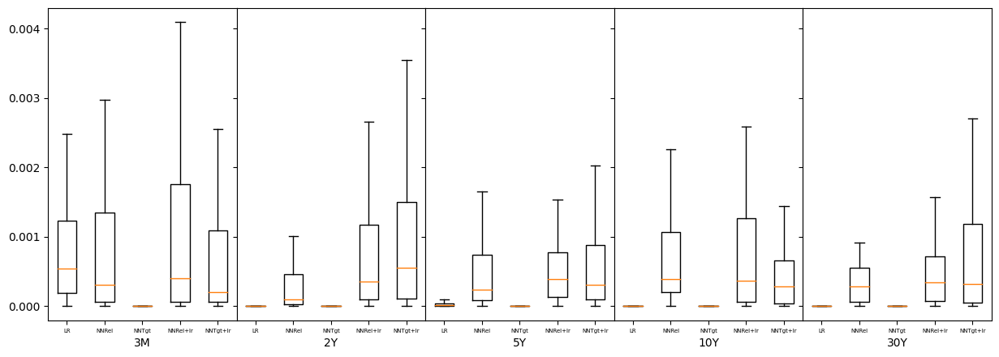

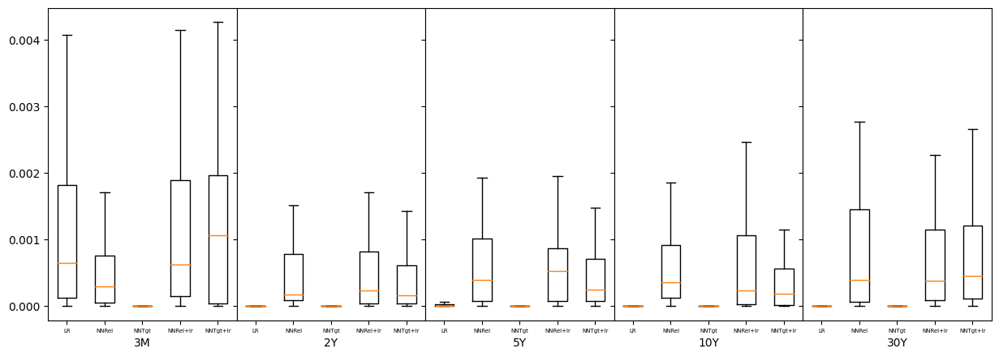

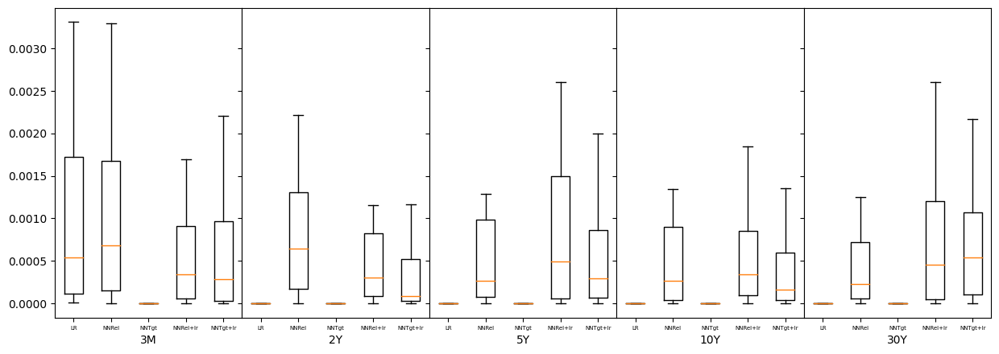

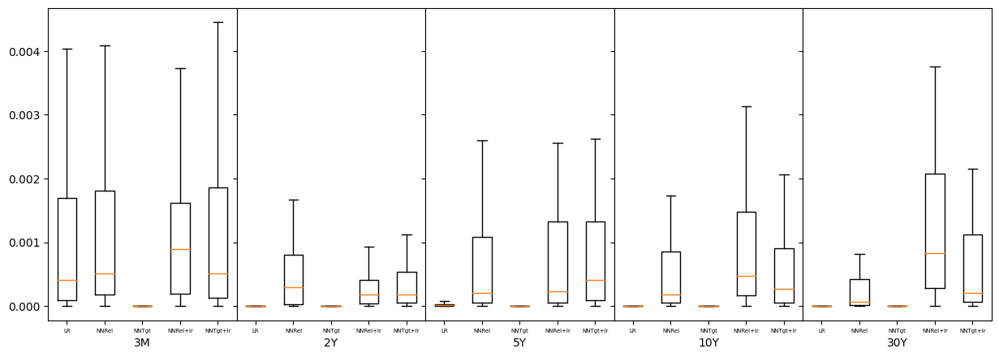

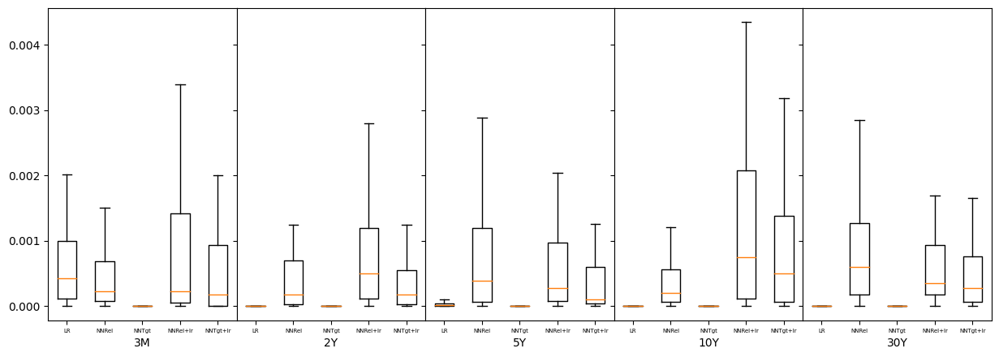

In [14]:
for i in range(len(horizons)):
    plot_function1(i)

In [15]:
table4_non_normalized = NN_RelFeat_non_normalized('GECU10YR_lag_1')

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/800
33/33 [==============================] - 1s 10ms/step - loss: 1997399.3750 - mae: 1007.0490 - mse: 1997399.3750 - root_mean_squared_error: 1413.2938 - val_loss: 82323.3828 - val_mae: 227.8435 - val_mse: 82323.3828 - val_root_mean_squared_error: 286.9205
Epoch 2/800
33/33 [==============================] - 0s 3ms/step - loss: 113822.9453 - mae: 266.8405 - mse: 113822.9453 - root_mean_squared_error: 337.3766 - val_loss: 60371.5156 - val_mae: 198.8271 - val_mse: 60371.5156 - val_root_mean_squared_error: 245.7062
Epoch 3/800
33/33 [==============================] - 0s 3ms/step - loss: 57457.1914 - mae: 194.3192 - mse: 57457.1914 - root_mean_squared_error: 239.7023 - val_loss: 30183.9453 - val_mae: 143.6353 - val_mse: 30183.9453 - val_root_mean_squared_error: 173.7353
Epoch 4/800
33/33 [==============================] - 0s 3ms/step - loss: 44917.3281 - mae: 173.2897 - mse: 44917.3281 - root_mean_squared_error: 211.9371 - val_loss: 25294.6016 - val_mae: 132.9675 - val_mse: 25294.

In [16]:
normalised_metrics=fig_5['GECU10YR_lag_1']#NN_RelFeat('GECU10Y_lag_1')
non_normalised_metrics=table4_non_normalized
table_4_dict={'Error':['MAE','MSE','RMSE'],
              'Normalised Mean':[normalised_metrics['mae'],
                                 normalised_metrics['mse'],
                                 normalised_metrics['rmse_values']],
              'Normalised Std Dev': [normalised_metrics['std_dev_mae'],
                                    normalised_metrics['std_dev_mse'],
                                    normalised_metrics['std_rmse']],
              
              'Non-Normalised Mean':[non_normalised_metrics['mae'],
                                 non_normalised_metrics['mse'],
                                 non_normalised_metrics['rmse_values']],
              'Non-Normalised Std Dev': [non_normalised_metrics['std_dev_mae'],
                                    non_normalised_metrics['std_dev_mse'],
                                    non_normalised_metrics['std_rmse']]
             }

In [17]:
#convert table 4 dict into dataframe
df_table4=pd.DataFrame.from_dict(table_4_dict)

In [18]:
df_table4

,Error,Normalised Mean,Normalised Std Dev,Non-Normalised Mean,Non-Normalised Std Dev
0,MAE,0.023933,0.015744,0.350177,0.269647
1,MSE,0.000821,0.001040,0.195334,0.296177
2,RMSE,0.028647,0.015744,0.441966,0.269647


In [19]:
d = {'Actual 10Y Yield': fig_5['Actual_Yield'], 'Predicted 10Y Yield': fig_5['Predicted_Yield']}

In [20]:
df = pd.DataFrame(data=d)

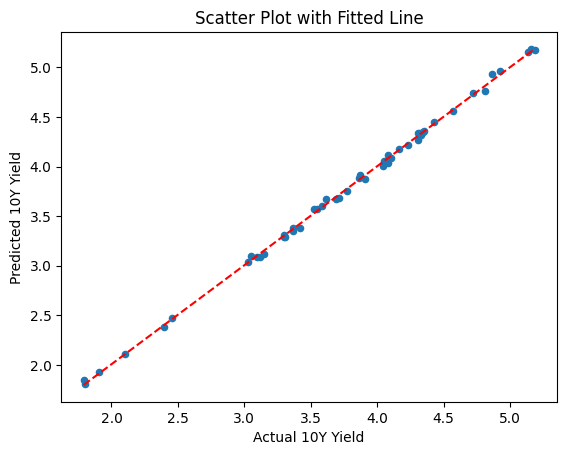

In [21]:
# Plotting the data

df = df.sort_values(by='Actual 10Y Yield')
df.plot(x='Actual 10Y Yield', y='Predicted 10Y Yield', kind='scatter', title='Scatter Plot with Fitted Line')

# Fit a line through the data using numpy.polyfit
fit = np.polyfit(df['Actual 10Y Yield'], df['Predicted 10Y Yield'], 1)

# Add the fitted line to the plot
plt.plot(df['Actual 10Y Yield'], np.polyval(fit, df['Actual 10Y Yield']), 'r--')


# Show the plot
plt.show()

In [22]:
def mlt_RelFeat(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    
    #feature_of_Interest=[list of interested features]'GECU2YR_lag_1'
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    
    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]
    
    target_columns=feature_of_Interest

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    
    lasso_model = Lasso(alpha=0.001)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    
    
    #X_train, X_test, y_train, y_test = train_test_split(selected_columns[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are your feature sets
    #scaler = StandardScaler()
    #scaler.fit(X_train)
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]
    # Normalize train and test sets
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(len(feature_of_Interest), activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    return a


In [23]:

horizons_mlt=[1,21]
list_mse_mlt=[]
for i in horizons_mlt:
    by_maturity_mlt=[]
    for j in yields:
        #print(j+str(i))
        target_=j+str(i)
        #print(target_)
        q=mlt_RelFeat([target_])
        by_maturity_mlt.append([q])
    list_mse_mlt.append(by_maturity_mlt)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.213e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 3.3305 - mae: 1.4685 - mse: 3.3305 - root_mean_squared_error: 1.8250 - val_loss: 0.6355 - val_mae: 0.6170 - val_mse: 0.6355 - val_root_mean_squared_error: 0.7972
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5060 - mae: 0.5154 - mse: 0.5060 - root_mean_squared_error: 0.7114 - val_loss: 0.2194 - val_mae: 0.3491 - val_mse: 0.2194 - val_root_mean_squared_error: 0.4684
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1469 - mae: 0.2916 - mse: 0.1469 - root_mean_squared_error: 0.3833 - val_loss: 0.0776 - val_mae: 0.2180 - val_mse: 0.0776 - val_root_mean_squared_error: 0.2786
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0693 - mae: 0.2092 - mse: 0.0693 - root_mean_squared_error: 0.2632 - val_loss: 0.0497 - val_mae: 0.1678 - val_mse: 0.0497 - val_root_mean_squared_error: 0.2228
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.474e+00, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.3399 - mae: 1.5341 - mse: 3.3399 - root_mean_squared_error: 1.8276 - val_loss: 0.5482 - val_mae: 0.6316 - val_mse: 0.5482 - val_root_mean_squared_error: 0.7404
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4537 - mae: 0.5303 - mse: 0.4537 - root_mean_squared_error: 0.6735 - val_loss: 0.2580 - val_mae: 0.3989 - val_mse: 0.2580 - val_root_mean_squared_error: 0.5079
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2274 - mae: 0.3737 - mse: 0.2274 - root_mean_squared_error: 0.4769 - val_loss: 0.1676 - val_mae: 0.3495 - val_mse: 0.1676 - val_root_mean_squared_error: 0.4094
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1464 - mae: 0.2901 - mse: 0.1464 - root_mean_squared_error: 0.3826 - val_loss: 0.1156 - val_mae: 0.3049 - val_mse: 0.1156 - val_root_mean_squared_error: 0.3401
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.137e+00, tolerance: 2.071e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.1151 - mae: 1.7537 - mse: 4.1151 - root_mean_squared_error: 2.0286 - val_loss: 0.5590 - val_mae: 0.6322 - val_mse: 0.5590 - val_root_mean_squared_error: 0.7477
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 0.2771 - mae: 0.3901 - mse: 0.2771 - root_mean_squared_error: 0.5264 - val_loss: 0.1457 - val_mae: 0.3079 - val_mse: 0.1457 - val_root_mean_squared_error: 0.3817
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1037 - mae: 0.2486 - mse: 0.1037 - root_mean_squared_error: 0.3220 - val_loss: 0.1228 - val_mae: 0.2740 - val_mse: 0.1228 - val_root_mean_squared_error: 0.3504
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0795 - mae: 0.2184 - mse: 0.0795 - root_mean_squared_error: 0.2820 - val_loss: 0.0844 - val_mae: 0.2279 - val_mse: 0.0844 - val_root_mean_squared_error: 0.2905
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.4742 - mae: 2.5205 - mse: 7.4742 - root_mean_squared_error: 2.7339 - val_loss: 1.8730 - val_mae: 1.1199 - val_mse: 1.8730 - val_root_mean_squared_error: 1.3686
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9262 - mae: 0.7103 - mse: 0.9262 - root_mean_squared_error: 0.9624 - val_loss: 0.5090 - val_mae: 0.5188 - val_mse: 0.5090 - val_root_mean_squared_error: 0.7134
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2095 - mae: 0.3507 - mse: 0.2095 - root_mean_squared_error: 0.4577 - val_loss: 0.2150 - val_mae: 0.3564 - val_mse: 0.2150 - val_root_mean_squared_error: 0.4637
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1014 - mae: 0.2485 - mse: 0.1014 - root_mean_squared_error: 0.3184 - val_loss: 0.1534 - val_mae: 0.3056 - val_mse: 0.1534 - val_root_mean_squared_error: 0.3917
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.246e+00, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.1294 - mae: 2.9414 - mse: 10.1294 - root_mean_squared_error: 3.1827 - val_loss: 4.0549 - val_mae: 1.7062 - val_mse: 4.0549 - val_root_mean_squared_error: 2.0137
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.6452 - mae: 0.9642 - mse: 1.6452 - root_mean_squared_error: 1.2827 - val_loss: 1.2620 - val_mae: 0.8942 - val_mse: 1.2620 - val_root_mean_squared_error: 1.1234
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5849 - mae: 0.5744 - mse: 0.5849 - root_mean_squared_error: 0.7648 - val_loss: 0.4553 - val_mae: 0.5307 - val_mse: 0.4553 - val_root_mean_squared_error: 0.6748
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2760 - mae: 0.4108 - mse: 0.2760 - root_mean_squared_error: 0.5254 - val_loss: 0.2239 - val_mae: 0.3627 - val_mse: 0.2239 - val_root_mean_squared_error: 0.4732
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.013e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.4443 - mae: 1.5072 - mse: 3.4443 - root_mean_squared_error: 1.8559 - val_loss: 0.5085 - val_mae: 0.6055 - val_mse: 0.5085 - val_root_mean_squared_error: 0.7131
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2343 - mae: 0.3843 - mse: 0.2343 - root_mean_squared_error: 0.4841 - val_loss: 0.0883 - val_mae: 0.2483 - val_mse: 0.0883 - val_root_mean_squared_error: 0.2972
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0868 - mae: 0.2304 - mse: 0.0868 - root_mean_squared_error: 0.2946 - val_loss: 0.0684 - val_mae: 0.2120 - val_mse: 0.0684 - val_root_mean_squared_error: 0.2615
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0694 - mae: 0.2041 - mse: 0.0694 - root_mean_squared_error: 0.2635 - val_loss: 0.0631 - val_mae: 0.2015 - val_mse: 0.0631 - val_root_mean_squared_error: 0.2513
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.693e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.1518 - mae: 1.4919 - mse: 3.1518 - root_mean_squared_error: 1.7753 - val_loss: 0.8050 - val_mae: 0.7947 - val_mse: 0.8050 - val_root_mean_squared_error: 0.8972
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3680 - mae: 0.4799 - mse: 0.3680 - root_mean_squared_error: 0.6067 - val_loss: 0.1027 - val_mae: 0.2609 - val_mse: 0.1027 - val_root_mean_squared_error: 0.3204
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1038 - mae: 0.2567 - mse: 0.1038 - root_mean_squared_error: 0.3222 - val_loss: 0.0600 - val_mae: 0.1925 - val_mse: 0.0600 - val_root_mean_squared_error: 0.2450
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.0624 - mae: 0.1976 - mse: 0.0624 - root_mean_squared_error: 0.2499 - val_loss: 0.0399 - val_mae: 0.1540 - val_mse: 0.0399 - val_root_mean_squared_error: 0.1997
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.217e+00, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.6767 - mae: 1.8811 - mse: 4.6767 - root_mean_squared_error: 2.1626 - val_loss: 1.8529 - val_mae: 1.1454 - val_mse: 1.8529 - val_root_mean_squared_error: 1.3612
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8614 - mae: 0.7284 - mse: 0.8614 - root_mean_squared_error: 0.9281 - val_loss: 0.4155 - val_mae: 0.4927 - val_mse: 0.4155 - val_root_mean_squared_error: 0.6446
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.2496 - mae: 0.3859 - mse: 0.2496 - root_mean_squared_error: 0.4996 - val_loss: 0.1734 - val_mae: 0.3235 - val_mse: 0.1734 - val_root_mean_squared_error: 0.4164
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1459 - mae: 0.2987 - mse: 0.1459 - root_mean_squared_error: 0.3820 - val_loss: 0.1074 - val_mae: 0.2619 - val_mse: 0.1074 - val_root_mean_squared_error: 0.3278
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+00, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 6.0567 - mae: 2.1857 - mse: 6.0567 - root_mean_squared_error: 2.4610 - val_loss: 0.9827 - val_mae: 0.8575 - val_mse: 0.9827 - val_root_mean_squared_error: 0.9913
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5178 - mae: 0.5788 - mse: 0.5178 - root_mean_squared_error: 0.7196 - val_loss: 0.2263 - val_mae: 0.3770 - val_mse: 0.2263 - val_root_mean_squared_error: 0.4757
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1733 - mae: 0.3337 - mse: 0.1733 - root_mean_squared_error: 0.4163 - val_loss: 0.1522 - val_mae: 0.3029 - val_mse: 0.1522 - val_root_mean_squared_error: 0.3901
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.1227 - mae: 0.2814 - mse: 0.1227 - root_mean_squared_error: 0.3503 - val_loss: 0.1157 - val_mae: 0.2657 - val_mse: 0.1157 - val_root_mean_squared_error: 0.3401
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.248e+00, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.4558 - mae: 2.9819 - mse: 10.4558 - root_mean_squared_error: 3.2335 - val_loss: 4.0479 - val_mae: 1.6608 - val_mse: 4.0479 - val_root_mean_squared_error: 2.0119
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.1386 - mae: 1.3826 - mse: 3.1386 - root_mean_squared_error: 1.7716 - val_loss: 0.5016 - val_mae: 0.5348 - val_mse: 0.5016 - val_root_mean_squared_error: 0.7083
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8464 - mae: 0.6911 - mse: 0.8464 - root_mean_squared_error: 0.9200 - val_loss: 0.3426 - val_mae: 0.4425 - val_mse: 0.3426 - val_root_mean_squared_error: 0.5853
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3144 - mae: 0.4340 - mse: 0.3144 - root_mean_squared_error: 0.5607 - val_loss: 0.1939 - val_mae: 0.3371 - val_mse: 0.1939 - val_root_mean_squared_error: 0.4403
Epoch 5/500
33/33 [==============================] - 0s 3m

In [24]:

axis=['3M','2Y','5Y','10Y','30Y']
def plot_stl_mtl(i):
    
    '''
    
    Function generates the graphs
    
    Input: number of horizons 
    
    returns the plot data as a nested list
    
    '''
    
    data = []

    for j in range(0, 5):
        list1 = []
        key = axis[j]
        if isinstance(list_mse[i][j][1], pd.DataFrame):
            list1.append(list_mse[i][j][1].values.flatten())
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        elif isinstance(list_mse[i][j][1], np.ndarray):
            list1.append(list_mse[i][j][1].flatten())
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        else:
            list1.append(list_mse[i][j][1])
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        data.append([key, list1])
    attemptlist = ['STL','MTL'] 
    fig, axes = plt.subplots(ncols= len(data), sharey=True,figsize=(15, 5))
    fig.subplots_adjust(wspace=0)
    for ax,d in zip(axes,data):     
        ax.boxplot([d[1][attemptlist.index(attempt)] for attempt in attemptlist],showfliers=False)
        ax.set(xticklabels=attemptlist, xlabel=d[0])
        ax.set_xticklabels(attemptlist, fontsize=8)
    plt.show()

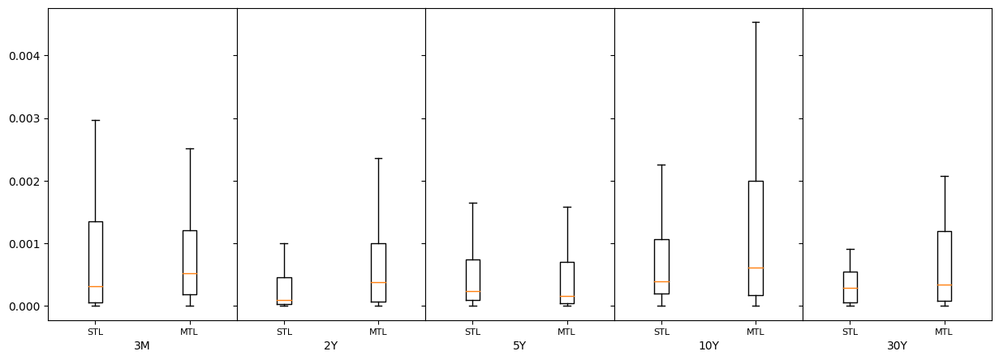

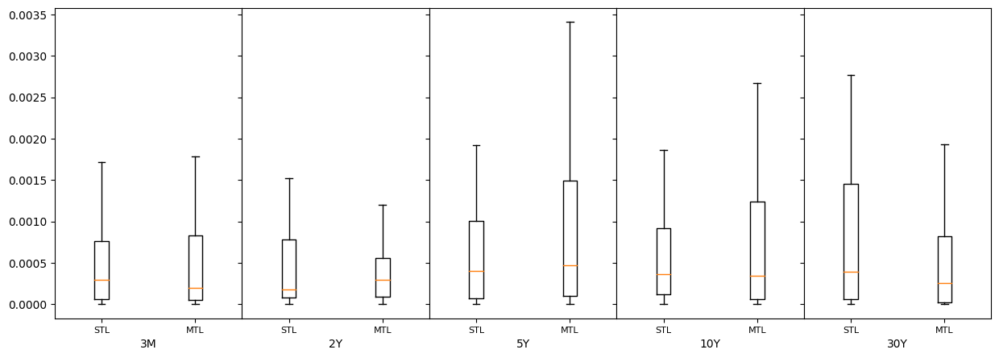

In [25]:
for i in range(len(horizons_mlt)):
    plot_stl_mtl(i)
    